<a href="https://colab.research.google.com/github/rhmau1/PCVK_26/blob/main/pertemuan_2b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [43]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
from google.colab import files

uploaded = files.upload()

Saving ktm scan.jpeg to ktm scan (2).jpeg


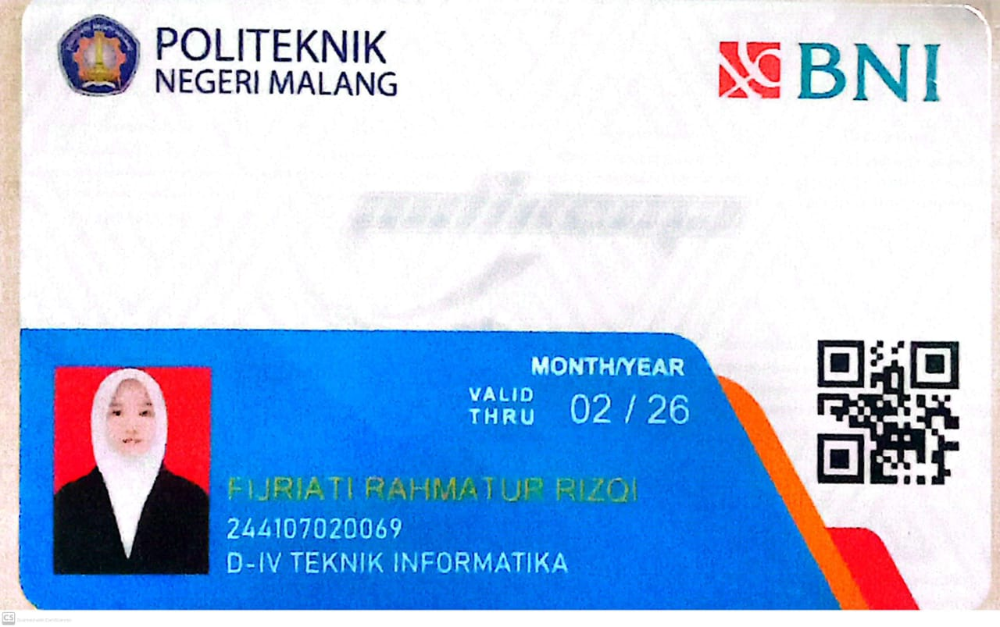

resolusi gambar: 1280  x  803


In [45]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('ktm scan.jpeg')
cv2_imshow(img)
print('resolusi gambar:', img.shape[1], " x ", img.shape[0])

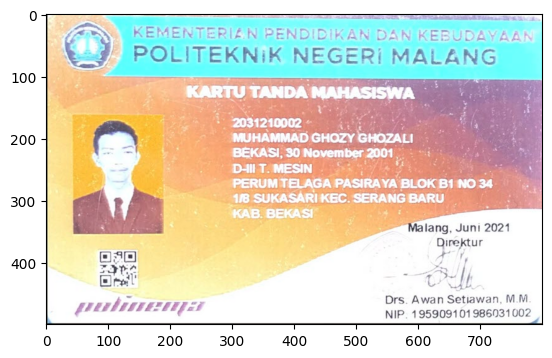

In [46]:
import matplotlib.pyplot as plt

img = cv2.imread('/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/KTM lama.jpg')
plt.imshow(img)
# plt.show()

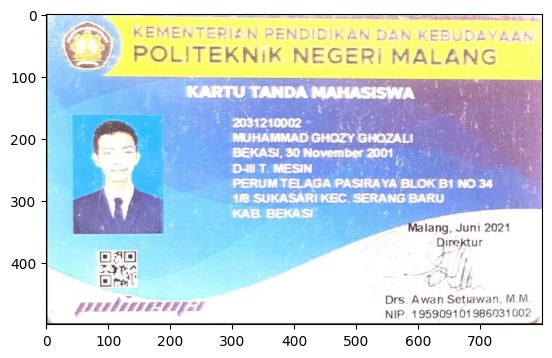

In [47]:
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img2)

Text(0.5, 1.0, 'dengan cmap')

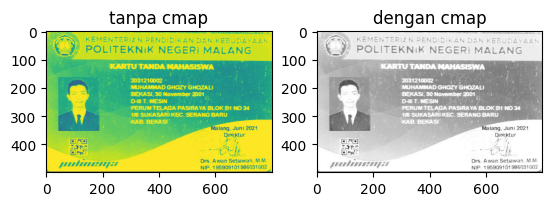

In [48]:
img_gray = cv2.imread('/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/KTM lama.jpg', cv2.IMREAD_GRAYSCALE)

# tanpa cmap
plt.subplot(1, 2, 1)
plt.imshow(img_gray)
plt.title('tanpa cmap')

# dengan cmap
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap='gray')
plt.title('dengan cmap')

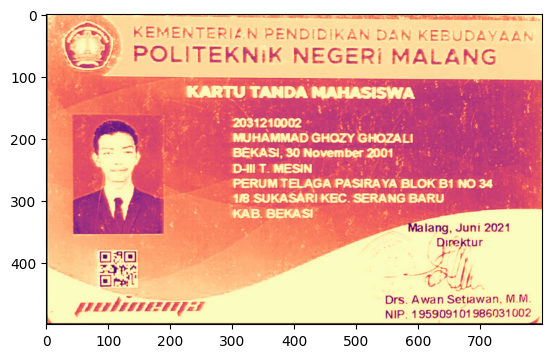

In [49]:
plt.imshow(img_gray, cmap="magma")

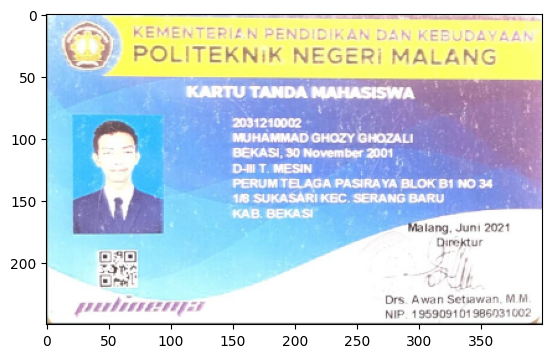

In [50]:
# melakukan resize
img = cv2.imread('/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/KTM lama.jpg')
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
imgRGBsmall = cv2.resize(imgRGB, (400, 250))
plt.imshow(imgRGBsmall)


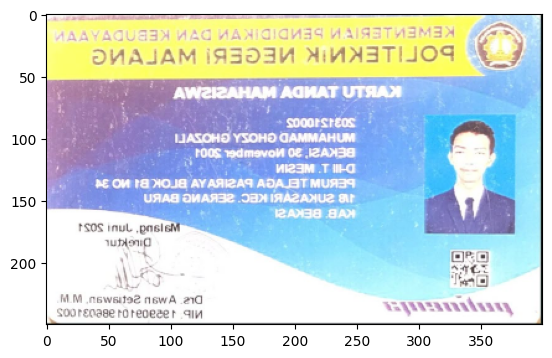

In [51]:
# melakukan flipping
imgBalik = cv2.flip(imgRGBsmall, 1)
plt.imshow(imgBalik)

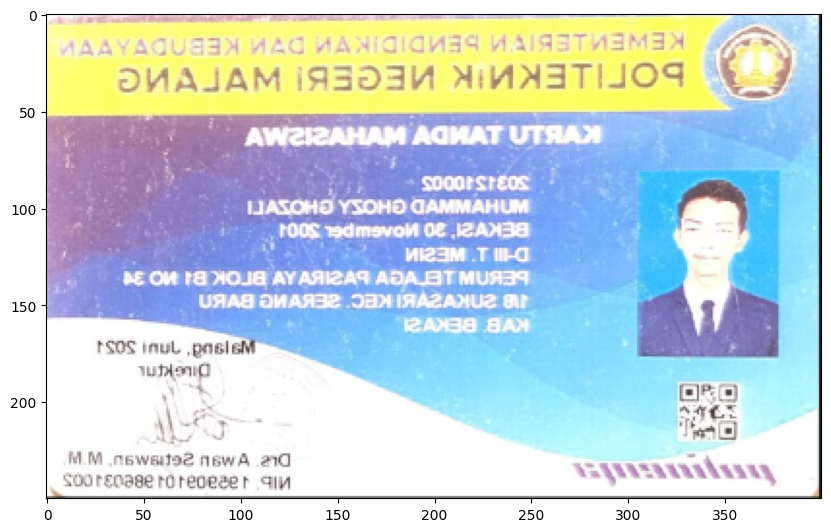

In [52]:
imgBalik = cv2.flip(imgRGBsmall, 1)
# tampilkan ukuran kanvas yang lebih besar
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111)
ax.imshow(imgBalik)


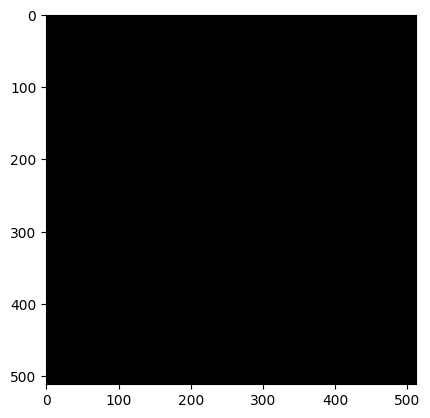

In [70]:
import numpy as np
black_img = np.zeros((512, 512, 3), dtype = np.int16)
plt.imshow(black_img)

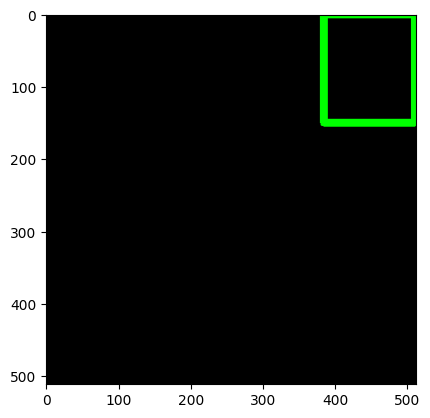

In [71]:
cv2.rectangle(black_img, pt1=(384,0), pt2=(510,150), color = (0,255,0), thickness=10)
plt.imshow(black_img)

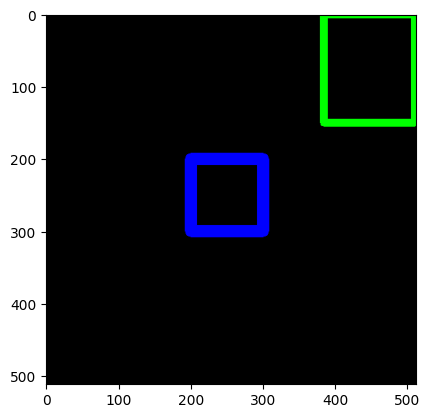

In [72]:
cv2.rectangle(black_img, pt1=(200,200), pt2=(300,300), color = (0,0,255), thickness=15)
plt.imshow(black_img)

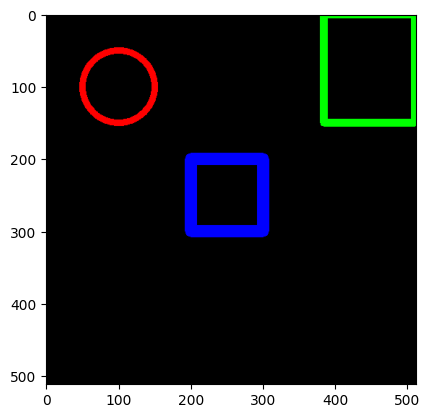

In [73]:
cv2.circle(black_img, center=( 100,100), radius=50, color = (255, 0,0), thickness=8)
plt.imshow(black_img)

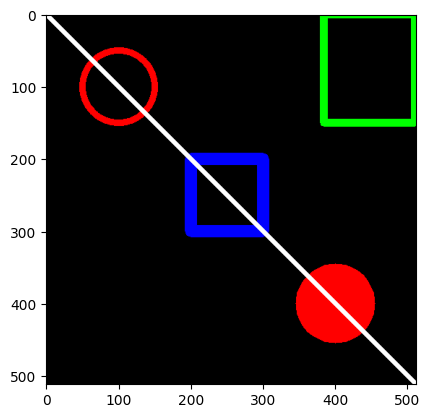

In [75]:
cv2.circle(black_img, center=( 400,400), radius=5, color = (255, 0,0), thickness=100)
cv2.line(black_img, pt1=(0,0), pt2=(512,512), color = (255,255,255), thickness=5)
plt.imshow(black_img)

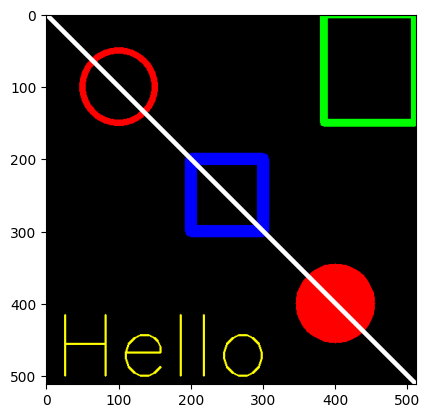

In [76]:
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(black_img, text = 'Hello', org =(10,500), fontFace=font, fontScale=4, color=(255,255,0), thickness=2, lineType=cv2.LINE_AA)
plt.imshow(black_img)

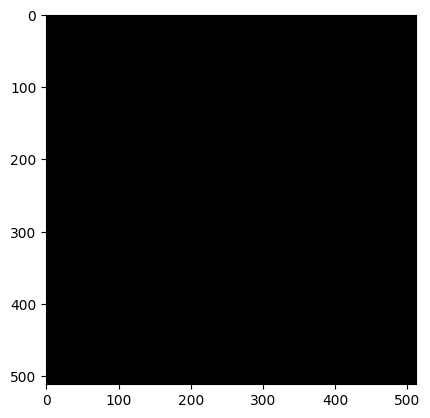

In [77]:
black_img2 = np.zeros(shape=(512,512,3), dtype=np.int32)
plt.imshow(black_img2)

In [81]:
vertices = np.array([[100,300],[200,200], [400,300],[200,400]],dtype=np.int32)
pts = vertices.reshape((-1,1,2)) #nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yang mewakili R,G,B

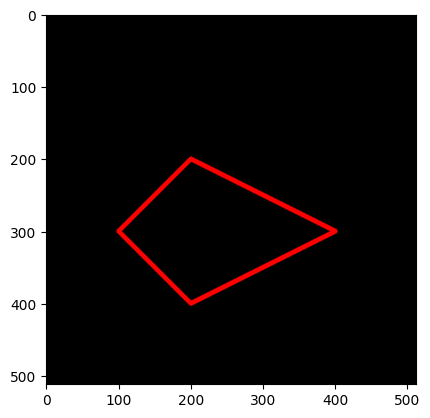

In [82]:
cv2.polylines(black_img2, [pts], isClosed=True, color=(255,0,0), thickness=5)
plt.imshow(black_img2)

#Pertanyaan praktikum D3
1. Apakah perbedaan gambar yang ditampilkan tanpa dan dengan matplotlib?
- dengan menggunakan matplotlib menampilkan koordinat gambarnya dengan sumbu X dan Y, skala, dan ada bingkai plotnya. jika tidak menggunakan matplotlib maka langsung menampilkan gambarnya tanpa ada sumbu koordinat skala disekelilingnya
2. Apakah perbedaan dan pengaruhnya pembuatan black image antara tipe data int16 dan int32?
- secara visual tidak ada perbedaan, hanya beda pada penggunaan memori, jika int16 maka menggunakan 16bit, dan int32 menggunakan 32bit
3. Apakah kegunaan “google.colab.patches import cv2_imshow” pada potongan kode berikut


```
from google.colab.patches import cv2_imshow
from skimage import io
```
- Fungsi asli cv2.imshow() dari OpenCV menyebabkan kernel Google Colab mengalami crash karena server Google Colab tidak memiliki antarmuka jendela grafis desktop. kode tersebut digunakan untuk import fungsi pengganti resmi agar gambar hasil pemrosesan OpenCV dapat langsung ditampilkan di dalam baris keluaran notebook Google Colab.
4. Apakah kegunaan “skimage import io” pada potongan kode soal nomor 3
- Membaca file gambar dari media penyimpanan lokal maupun tautan URL web (menggunakan fungsi io.imread) langsung menjadi array NumPy berformat warna RGB.

#PRAKTIKUM D3
Berdasarkan praktikum bagian 1 dan 2 kerjakan beberapa tugas berikut

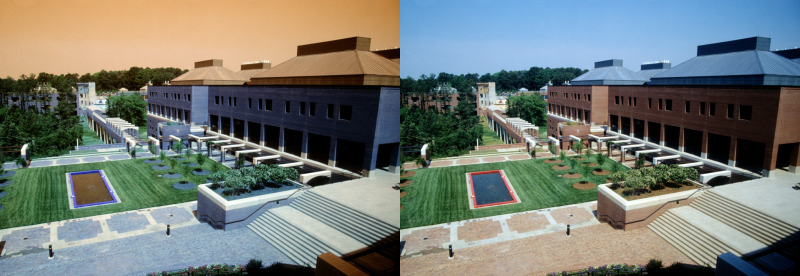

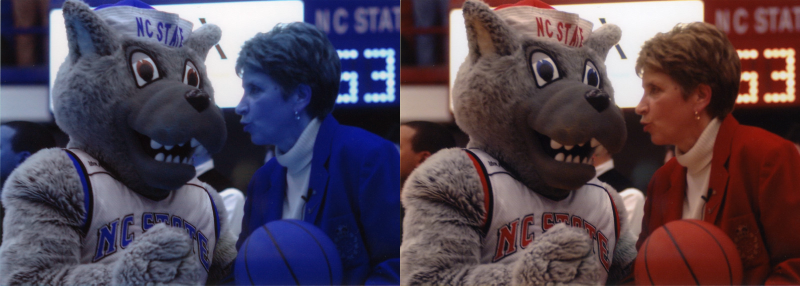

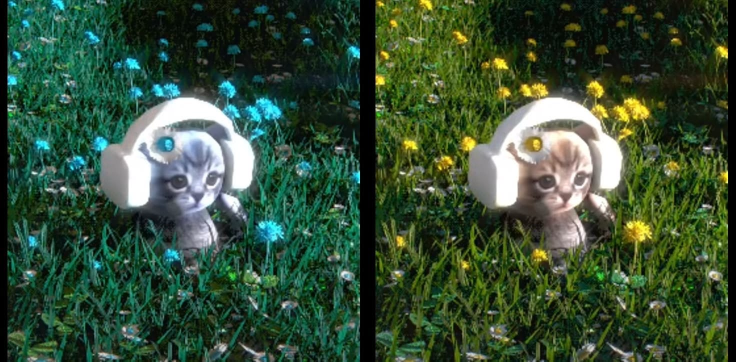



resolusi image: tinggi x lebar =  362  x  368


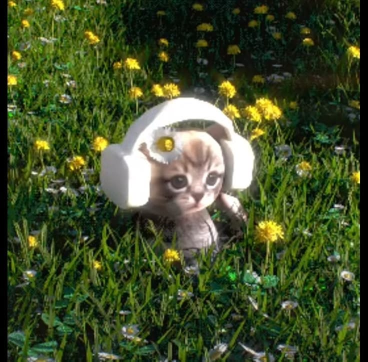

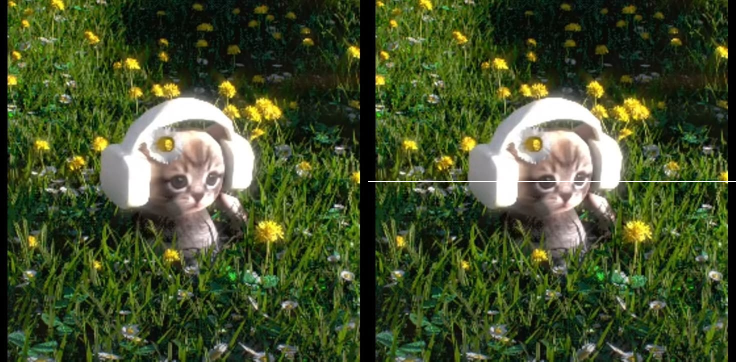

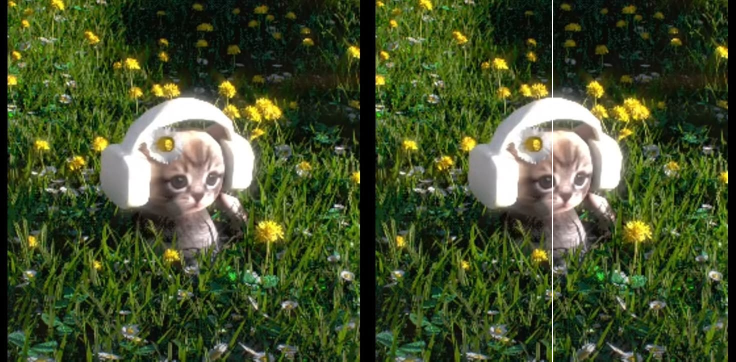

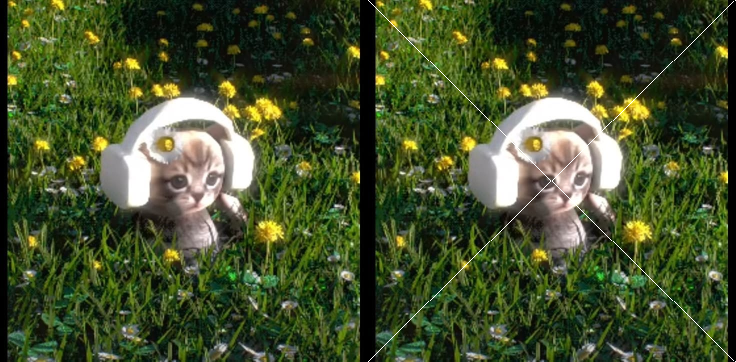

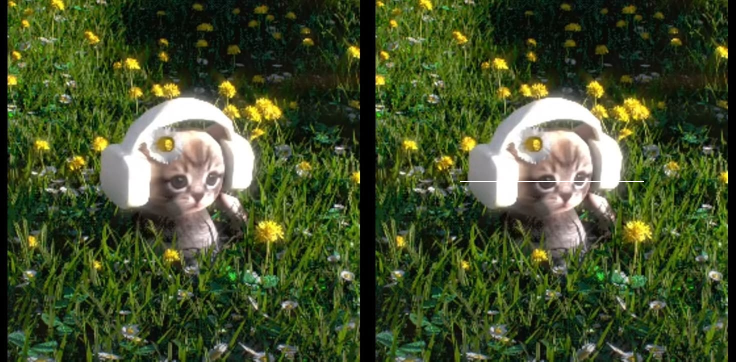

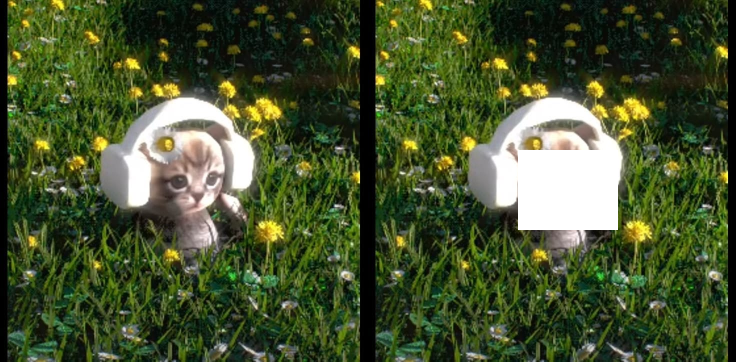

In [84]:
# PRAKTIKUM 1 DAN 2
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from skimage import transform
from PIL import Image, ImageDraw
import matplotlib.pylab as plt
# Membuat list untuk menyimpan url dari beberapa image
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
        "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
        "https://i.pinimg.com/736x/f9/5f/43/f95f43dbd59cedfc8bc99f42c8a5c80a.jpg"]
# baca dan tampilkan image
# loop pada tiap url image, beberapa image dapat disimpan pada list
for url in urls:
    image = io.imread(url)                           #read image
    image = cv.resize(image, (0,0), fx=0.5, fy=0.5)  #resize image to half size
    image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)   #convert color to RGB
    final_frame = cv.hconcat((image, image_2))       #concatenate image
    cv2_imshow(final_frame)                          #show image
    print('\n')

tinggi = image_2.shape[0]
lebar = image_2.shape[1]
print("resolusi image: tinggi x lebar = ",tinggi," x ",lebar)
cv2_imshow(image_2)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

#membuat garis horizontal ditengah image
for y in range (lebar):
  image_3[int((tinggi)/2),y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

#membuat garis vertikal ditengah image
for x in range (tinggi):
  image_3[x, int((lebar)/2)] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# membuat garis diagonal menyilang pada image
for x in range(tinggi):
    # Diagonal dari kiri atas ke kanan bawah
    y1 = int(x * (lebar - 1) / (tinggi - 1))
    if y1 < lebar: # Pastikan koordinat y tidak melebihi lebar gambar
        image_3[x, y1] = [255,255,255]

    # Diagonal dari kanan atas ke kiri bawah
    y2 = int((tinggi - 1 - x) * (lebar - 1) / (tinggi - 1))
    if y2 >= 0 and y2 < lebar: # Pastikan koordinat y tidak melebihi lebar gambar
        image_3[x, y2] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

#membuat garis horizontal di tengah image dengan panjang yang bisa diatur
# Tentukan titik awal dan akhir garis horizontal
start_length = int(lebar * 0.25) # Mulai dari 25% lebar gambar
end_length = int(lebar * 0.75)   # Berakhir di 75% lebar gambar

for y in range (start_length, end_length):
  image_3[int((tinggi)/2),y] = [255,255,255] # Garis di tengah tinggi gambar

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

#membuat kotak dengan kumpulan pixel putih di sembarang tempat dengan ukuran bisa diatur
# Tentukan posisi sudut kiri atas kotak
start_x = 150  # Koordinat X awal
start_y = 150  # Koordinat Y awal

# Tentukan ukuran kotak
box_width = 100
box_height = 80

# Pastikan kotak tidak keluar dari batas gambar
end_x = min(start_x + box_height, tinggi)
end_y = min(start_y + box_width, lebar)

for x in range(start_x, end_x):
  for y in range(start_y, end_y):
    image_3[x, y] = [255,255,255] # Set pixel menjadi putih

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

Ukuran pixel asli: (803, 1280, 3)


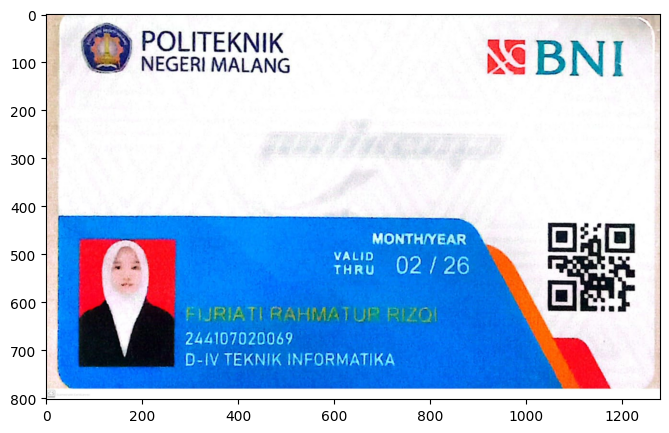

Ukuran pixel setelah figsize: (803, 1280, 3)


In [90]:
# Dengan menggunakan figsize, perhatikan apakah ukuran image pixelnya juga berubah?
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Membaca gambar
img1 = cv2.imread('ktm scan.jpeg')
print("Ukuran pixel asli:", img1.shape)

# Menampilkan dengan figsize
fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(111)
ax.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.show()

# Pengecekan ukuran pixel array
print("Ukuran pixel setelah figsize:", img1.shape)

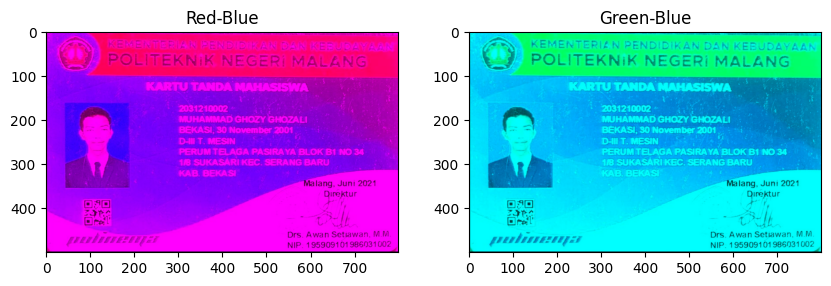

In [91]:
# Tampilkan image dalam channel Red-Blue dan Green-Blue saja!
# Pisahkan channel
b,g,r = cv.split(img)

# Red-Blue (Green di-nolkan)
rb = cv.merge([b, np.zeros_like(g), r])

# Green-Blue (Red di-nolkan)
gb = cv.merge([b, g, np.zeros_like(r)])

# Tampilkan
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(rb, cv.COLOR_BGR2RGB))
plt.title("Red-Blue")

plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(gb, cv.COLOR_BGR2RGB))
plt.title("Green-Blue")
plt.show()

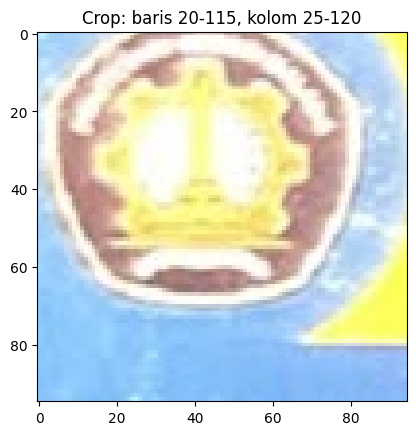

In [92]:
# Tampilkan image baris ke 20-115, kolom 25-120!
crop1 = img[20:115, 25:120]
plt.imshow(cv.cvtColor(crop1, cv.COLOR_BGR2RGB))
plt.title("Crop: baris 20-115, kolom 25-120")
plt.show()

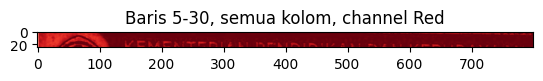

In [93]:
# Tampilkan image baris ke 5-30, semua kolom, channel Red saja!
red_channel = img[5:30, :, 2]   # channel ke-2 = Red

plt.imshow(red_channel, cmap='Reds')
plt.title("Baris 5-30, semua kolom, channel Red")
plt.show()

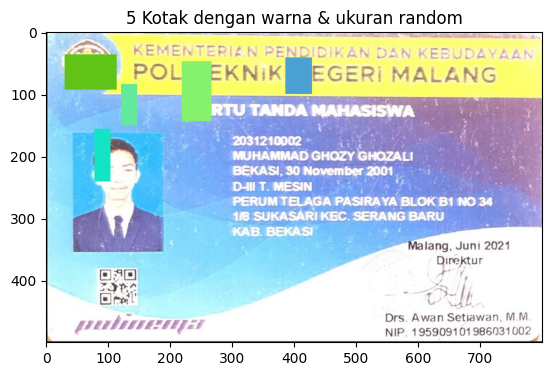

In [94]:
# Buat 5 kotak berbagai ukuran dan warna yang berbeda dalam satu image. disarankan menggunakan bilangan acak/random!
# Salin image asli
img_boxes = img.copy()

# Buat 5 kotak acak
for i in range(5):
    x1, y1 = np.random.randint(0, img.shape[1]//2), np.random.randint(0, img.shape[0]//2)
    x2, y2 = x1 + np.random.randint(20,100), y1 + np.random.randint(20,100)
    color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
    cv.rectangle(img_boxes, (x1,y1), (x2,y2), color, -1)  # -1 isi penuh

plt.imshow(cv.cvtColor(img_boxes, cv.COLOR_BGR2RGB))
plt.title("5 Kotak dengan warna & ukuran random")
plt.show()

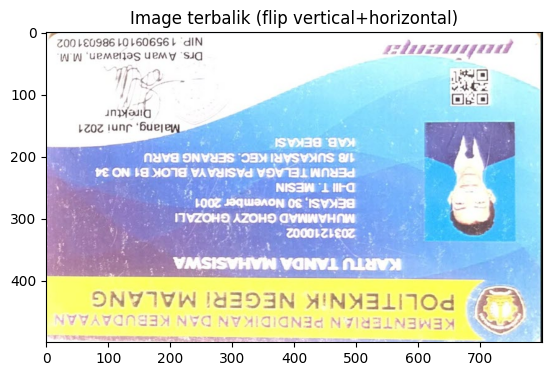

In [95]:
# Tampilkan image dengan posisi terbalik!
# Membalik gambar secara vertikal dan horizontal
flip_img = cv.flip(img, -1)  # -1 artinya vertikal + horizontal

plt.imshow(cv.cvtColor(flip_img, cv.COLOR_BGR2RGB))
plt.title("Image terbalik (flip vertical+horizontal)")
plt.show()

Berdasarkan praktikum bagian 3 dan 4 kerjakan beberapa tugas berikut

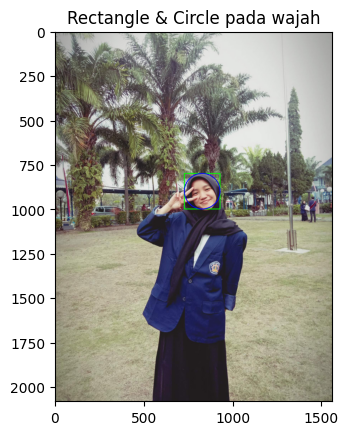

In [109]:
# Buat rectangle dan circle pada bagian wajah dari image foto s anda saat beraktifitas (bukan pasfoto).
uploaded = files.upload()
img = cv2.imread('almet.jpg')

foto_wajah = img.copy()

# Rectangle pada wajah
cv.rectangle(foto_wajah, pt1=(725,800), pt2=(925,1000), color=(0,255,0), thickness=3)

# Circle di wajah
cv.circle(foto_wajah, center=(825,900), radius=100, color=(255,0,0), thickness=3)

plt.imshow(cv.cvtColor(foto_wajah, cv.COLOR_BGR2RGB))
plt.title("Rectangle & Circle pada wajah")
plt.show()


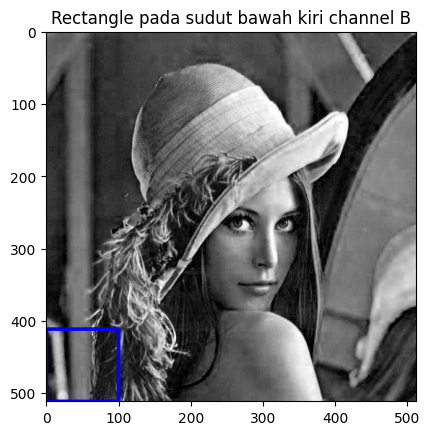

In [111]:
# Buat rectangle pada bagian sudut bawah kiri channel B pada color space RGB dari citra kitten/ lena/ mandrill/ male/ female/ couple/ sailboat/ peppers!
# Load image
img_lena = cv.imread('/content/drive/MyDrive/TI 3C RESOURCES /PCVK/Images/lena.jpg')

# Ambil channel B (index 0)
blue_channel = img_lena[:,:,0]

# Ubah ke 3 channel lagi supaya rectangle bisa terlihat berwarna
blue_3c = cv.merge([blue_channel, blue_channel, blue_channel])

# Rectangle di sudut bawah kiri
h, w = blue_channel.shape
cv.rectangle(blue_3c, pt1=(0, h-100), pt2=(100, h), color=(0,0,255), thickness=3)

plt.imshow(blue_3c, cmap='gray')
plt.title("Rectangle pada sudut bawah kiri channel B")
plt.show()

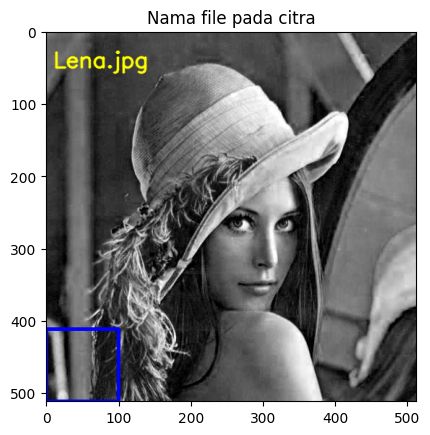

In [112]:
# Lengkapi tulisan nama file pada file citra dari soal no.8. gunakan font, ukuran font, dan warna font yang sesuai keinginan anda.
img_text = blue_3c.copy()

font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(img_text, text='Lena.jpg', org=(10,50), fontFace=font,
           fontScale=1, color=(255,255,0), thickness=2, lineType=cv.LINE_AA)

plt.imshow(img_text)
plt.title("Nama file pada citra")
plt.show()